In [3]:
import cv2 as cv
import importlib
import io
import matplotlib.pyplot as plt
import numpy as np
import os
import openslide
from openslide import open_slide
from pathlib import Path
import pandas as pd
from PIL import Image, ImageOps, ImageChops, ImageDraw
import SimpleITK as sitk
from skimage.color import rgb2hed
from skimage.filters import threshold_otsu
from skimage.morphology import remove_small_holes
import staintools
from staintools import stain_normalizer, LuminosityStandardizer
from staintools.preprocessing.input_validation import is_uint8_image
import sys

In [4]:
# Import HEMnet package
BASE_DIR = Path().resolve().parent
HEMNET_DIR = BASE_DIR.joinpath('HEMnet')
sys.path.append(str(HEMNET_DIR))

from slide import *
from utils import *
from normaliser import LuminosityStandardizerIterative, ReinhardColorNormalizerIterative, StainNormalizerIterative

In [12]:
import utils
importlib.reload(utils)
from utils import *

import normaliser
importlib.reload(normaliser)
from normaliser import LuminosityStandardizerIterative, ReinhardColorNormalizerIterative, StainNormalizerIterative

In [10]:
# User Input parameters
#SLIDES_PATH = Path('/gpfs1/scratch/90days/s4436005/Slides/gold_standards')
SLIDES_PATH = Path('/gpfs1/scratch/90days/s4436005')
#OUTPUT_PATH = Path('/gpfs1/scratch/90days/s4436005/img_reg/gold_standards/1957_T')
OUTPUT_PATH = Path('/gpfs1/scratch/90days/s4436005/img_reg/17_01_20_testing')
#OUTPUT_PATH = Path('/gpfs1/scratch/90days/s4436005/img_reg/train_dataset_10x_11_12_19_strict')
TEMPLATE_SLIDE_PATH = Path('/gpfs1/scratch/90days/s4436005/2171_T_11524A_2_HandE.svs')

ALIGNMENT_MAG = 2
TILE_MAG = 10
VERBOSE = True
CANCER_THRESH = 0.39
NON_CANCER_THRESH = 0.40
NORMALISER_METHOD = "vahadane"

#Verbose functions
if VERBOSE:
    verbose_print = lambda *args: print(*args)
    verbose_save_img = lambda img, path, img_type: img.save(path, img_type)
    verbose_save_fig = lambda fig, path, dpi=300: fig.savefig(path, dpi=dpi)
else:
    verbose_print = lambda *args: None
    verbose_save_img = lambda *args: None
    verbose_save_fig = lambda *args: None

# Find Slides
slides = []
for slide in SLIDES_PATH.glob('*.svs'):
    name = slide.name
    slides.append(name)
slides.sort()
slides

['1820_N_10545A_2_HandE.svs',
 '1820_N_10545A_4_TP53.svs',
 '1820_T_105452F_2_HandE.svs',
 '1820_T_105452F_4_TP53.svs',
 '2065_N_12752A_2_HandE.svs',
 '2065_N_12752A_4_TP53.svs',
 '2065_T_12756A_2_HandE.svs',
 '2065_T_12756A_4_TP53.svs',
 '2112_N_12341B_2_HandE.svs',
 '2112_N_12341B_4_TP53.svs',
 '2112_T_12335F_2_HandE.svs',
 '2112_T_12335F_4_TP53.svs',
 '2148_N_11397A_2_HandE.svs',
 '2148_N_11397A_4_TP53.svs',
 '2148_T_11393A_2_HandE.svs',
 '2148_T_11393A_4_TP53.svs',
 '2171_N_11521A_2_HandE.svs',
 '2171_N_11521A_4_TP53.svs',
 '2171_T_11524A_2_HandE.svs',
 '2171_T_11524A_4_TP53.svs']

In [7]:
TP53_slides = [slide for slide in slides if 'TP53' in slide]
HE_slides = [slide for slide in slides if 'HandE' in slide]
Paired_slides = list(zip(TP53_slides, HE_slides))
print('Found {0} pairs of slides'.format(len(Paired_slides)))
for i, pair in enumerate(Paired_slides):
    tp53, he = pair
    verbose_print('{0}. {1}|{2}'.format(i + 1, tp53, he))

Found 10 pairs of slides
1. 1820_N_10545A_4_TP53.svs|1820_N_10545A_2_HandE.svs
2. 1820_T_105452F_4_TP53.svs|1820_T_105452F_2_HandE.svs
3. 2065_N_12752A_4_TP53.svs|2065_N_12752A_2_HandE.svs
4. 2065_T_12756A_4_TP53.svs|2065_T_12756A_2_HandE.svs
5. 2112_N_12341B_4_TP53.svs|2112_N_12341B_2_HandE.svs
6. 2112_T_12335F_4_TP53.svs|2112_T_12335F_2_HandE.svs
7. 2148_N_11397A_4_TP53.svs|2148_N_11397A_2_HandE.svs
8. 2148_T_11393A_4_TP53.svs|2148_T_11393A_2_HandE.svs
9. 2171_N_11521A_4_TP53.svs|2171_N_11521A_2_HandE.svs
10. 2171_T_11524A_4_TP53.svs|2171_T_11524A_2_HandE.svs


In [28]:
#Keep track of performance metric for each slide
performance_df = pd.DataFrame((Paired_slides), columns = ["TP53_Slide_Name","H&E_Slide_Name"])
performance_df["Template_Slide_Name"] = TEMPLATE_SLIDE_PATH.name

In [29]:
performance_df

,TP53_Slide_Name,H&E_Slide_Name,Template_Slide_Name
0,1820_N_10545A_4_TP53.svs,1820_N_10545A_2_HandE.svs,2171_T_11524A_2_HandE.svs
1,1820_T_105452F_4_TP53.svs,1820_T_105452F_2_HandE.svs,2171_T_11524A_2_HandE.svs
2,2065_N_12752A_4_TP53.svs,2065_N_12752A_2_HandE.svs,2171_T_11524A_2_HandE.svs
3,2065_T_12756A_4_TP53.svs,2065_T_12756A_2_HandE.svs,2171_T_11524A_2_HandE.svs
4,2112_N_12341B_4_TP53.svs,2112_N_12341B_2_HandE.svs,2171_T_11524A_2_HandE.svs
5,2112_T_12335F_4_TP53.svs,2112_T_12335F_2_HandE.svs,2171_T_11524A_2_HandE.svs
6,2148_N_11397A_4_TP53.svs,2148_N_11397A_2_HandE.svs,2171_T_11524A_2_HandE.svs
7,2148_T_11393A_4_TP53.svs,2148_T_11393A_2_HandE.svs,2171_T_11524A_2_HandE.svs
8,2171_N_11521A_4_TP53.svs,2171_N_11521A_2_HandE.svs,2171_T_11524A_2_HandE.svs
9,2171_T_11524A_4_TP53.svs,2171_T_11524A_2_HandE.svs,2171_T_11524A_2_HandE.svs


In [33]:
# Load and fit template slide
template_slide = open_slide(str(TEMPLATE_SLIDE_PATH))
template = read_slide_at_mag(template_slide, ALIGNMENT_MAG).convert('RGB')
if NORMALISER_METHOD == "reinhard":
    normaliser = ReinhardColorNormalizerIterative()
    normaliser.fit_target(np.array(template))
else:
    normaliser = StainNormalizerIterative(method=NORMALISER_METHOD)
    lumStd = LuminosityStandardizerIterative()
    template_std = lumStd.standardize(np.array(template))
    normaliser.fit_target(template_std)

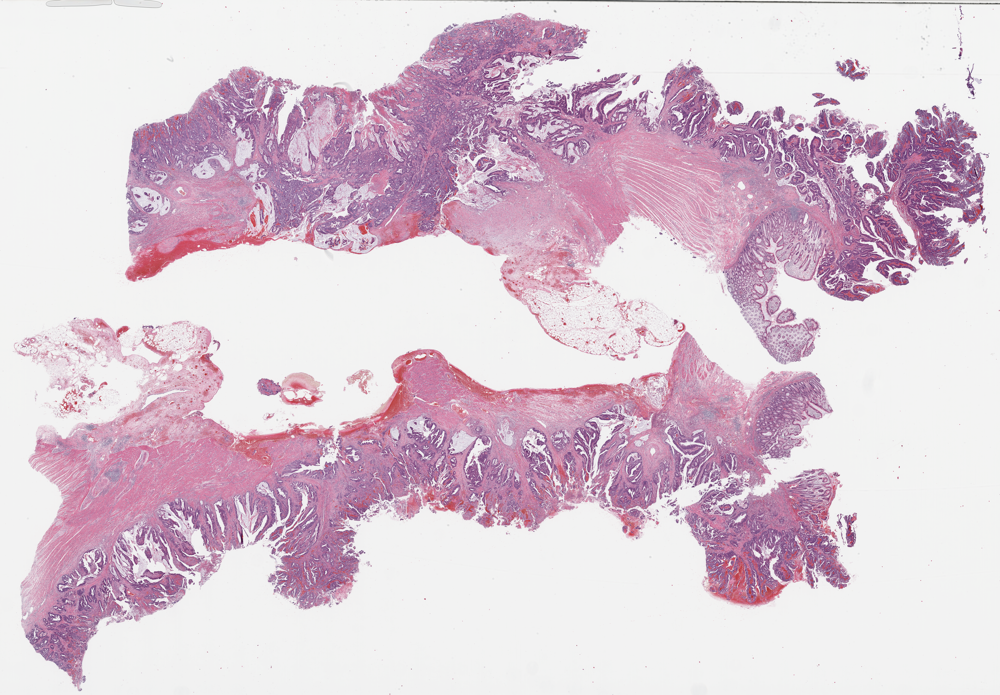

In [34]:
thumbnail(template)

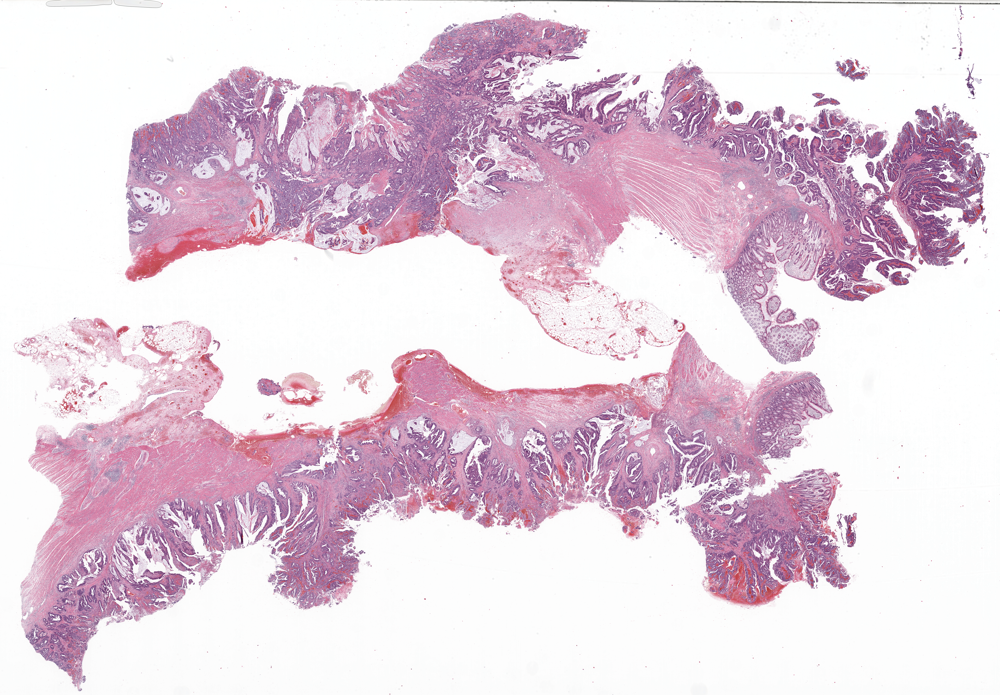

In [36]:
thumbnail(Image.fromarray(template_std))

In [30]:
SLIDE_NUM = 2
PREFIX = Paired_slides[SLIDE_NUM][0][:-8]
verbose_print('Processing Slide: {0}'.format(PREFIX))
tp53_name, he_name = Paired_slides[SLIDE_NUM]
tp53_slide = open_slide(str(SLIDES_PATH.joinpath(tp53_name)))
he_slide = open_slide(str(SLIDES_PATH.joinpath(he_name)))

Processing Slide: 2065_N_12752A_4_


In [31]:
#Load Slides
he = read_slide_at_mag(he_slide, ALIGNMENT_MAG)
tp53 = read_slide_at_mag(tp53_slide, ALIGNMENT_MAG)

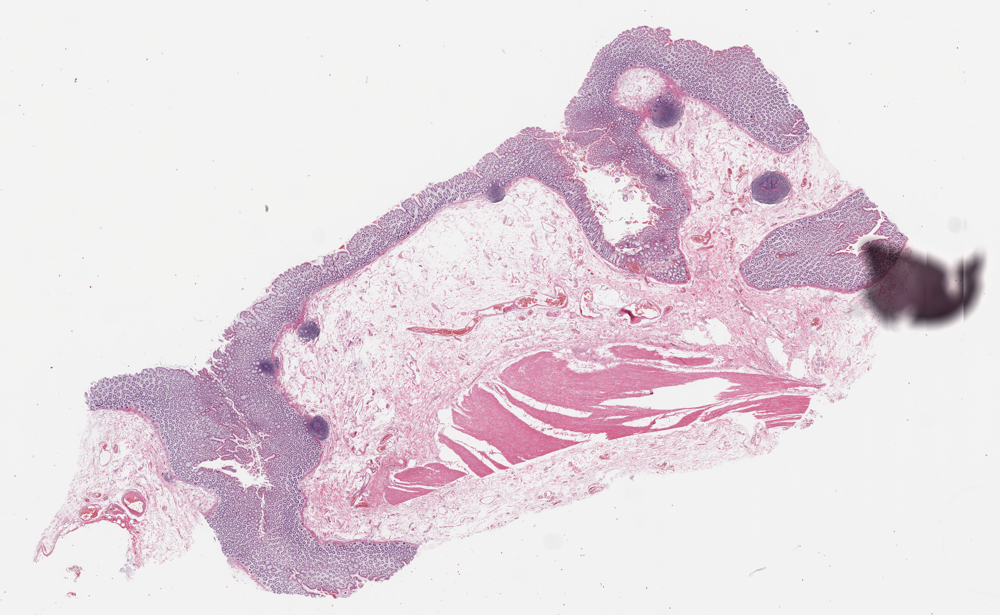

In [32]:
thumbnail(he)

In [39]:
#Normalise H&E Slide
if NORMALISER_METHOD == "reinhard":
    normaliser.fit_source(np.array(he))
    he_transformed = normaliser.transform_tile(np.array(he))
else:
    lumStd.fit(np.array(he))
    he_std = lumStd.standardize_tile(np.array(he))
    normaliser.fit_source(np.array(he_std))
    he_transformed = normaliser.transform_tile(he_std)
he_norm_small = Image.fromarray(he_transformed)

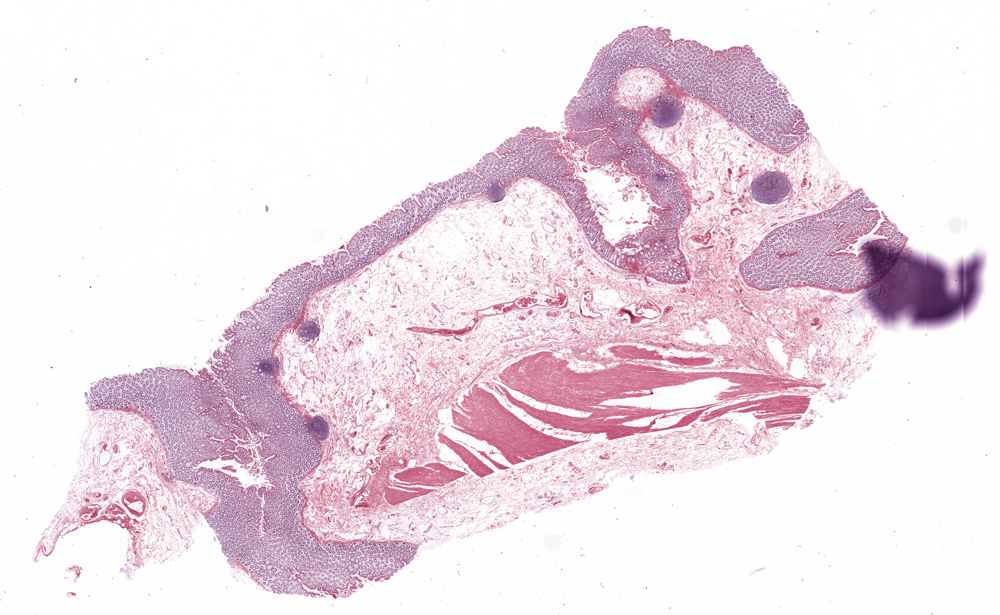

In [40]:
thumbnail(he_norm_small)

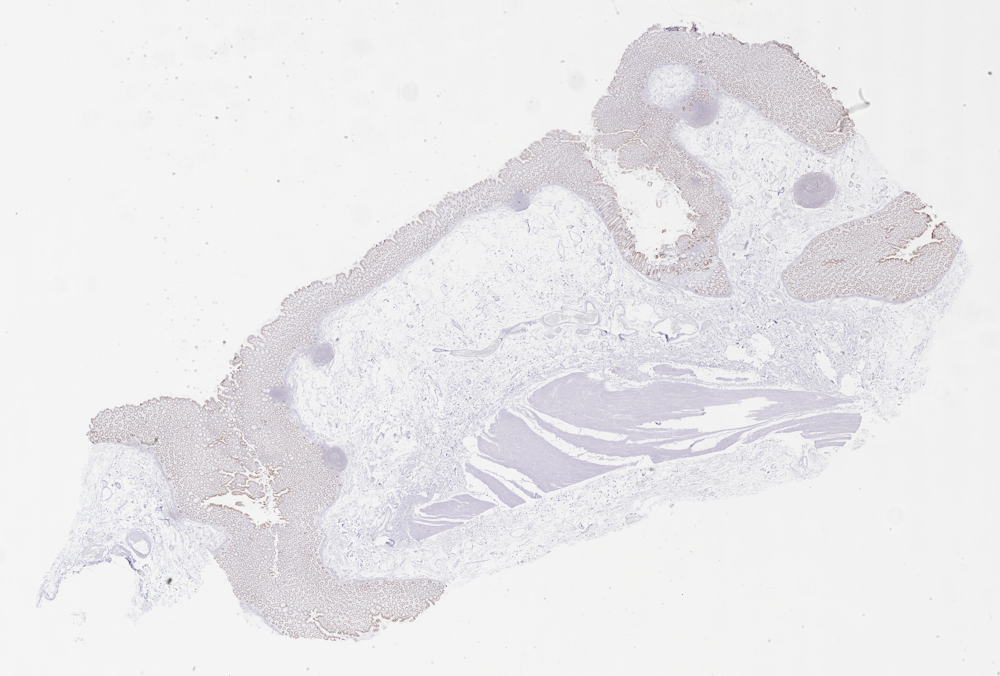

In [41]:
thumbnail(tp53)

In [42]:
######################
# Image Registration #
######################

INTERPOLATOR = sitk.sitkLanczosWindowedSinc

#Convert to grayscale
tp53_gray = tp53.convert('L')
he_gray = he_norm_small.convert('L')
#Convert to ITK format
tp53_itk = get_itk_from_pil(tp53_gray)
he_itk = get_itk_from_pil(he_gray)
#Set fixed and moving images
fixed_img = he_itk
moving_img = tp53_itk

In [43]:
# Check initial registration
# Centre the two images, then compare their alignment
initial_transform = sitk.CenteredTransformInitializer(fixed_img, moving_img, sitk.Euler2DTransform(), 
                                                      sitk.CenteredTransformInitializerFilter.GEOMETRY)
moving_rgb = sitk_transform_rgb(tp53, he_norm_small, initial_transform)
comparison_pre = show_alignment(he_norm_small, moving_rgb, prefilter = True)
verbose_save_img(comparison_pre.convert('RGB'), OUTPUT_PATH.joinpath(PREFIX + 'comparison_pre_registration.jpeg'), 'JPEG' )

In [47]:
#Compute the mutual information between the two images before registration 
moving_resampled_initial = sitk.Resample(moving_img, fixed_img, initial_transform, 
                                 INTERPOLATOR, 0.0, moving_img.GetPixelID())
initial_mutual_info = calculate_mutual_info(np.array(he_gray), np.array(get_pil_from_itk(moving_resampled_initial)))
verbose_print('Initial mutual information metric: {0}'.format(initial_mutual_info))

Initial mutual information metric: 0.11136672139079556


In [69]:
performance_df.loc[SLIDE_NUM, "Initial_Mutual_Info"] = initial_mutual_info
performance_df

,TP53_Slide_Name,H&E_Slide_Name,Template_Slide_Name,Initial_Mutual_Info
0,1820_N_10545A_4_TP53.svs,1820_N_10545A_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN
1,1820_T_105452F_4_TP53.svs,1820_T_105452F_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN
2,2065_N_12752A_4_TP53.svs,2065_N_12752A_2_HandE.svs,2171_T_11524A_2_HandE.svs,0.111367
3,2065_T_12756A_4_TP53.svs,2065_T_12756A_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN
4,2112_N_12341B_4_TP53.svs,2112_N_12341B_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN
5,2112_T_12335F_4_TP53.svs,2112_T_12335F_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN
6,2148_N_11397A_4_TP53.svs,2148_N_11397A_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN
7,2148_T_11393A_4_TP53.svs,2148_T_11393A_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN
8,2171_N_11521A_4_TP53.svs,2171_N_11521A_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN
9,2171_T_11524A_4_TP53.svs,2171_T_11524A_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN


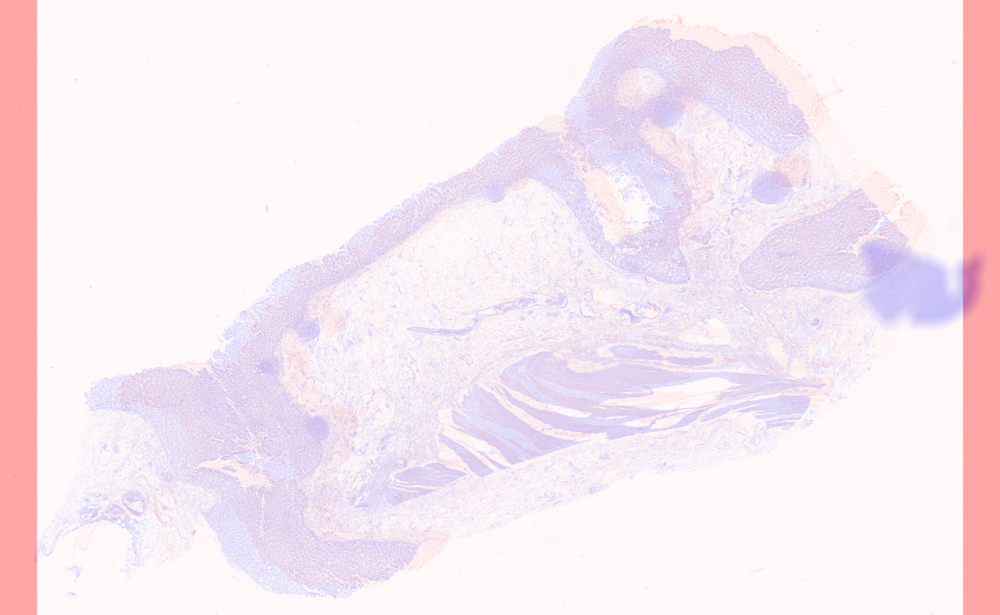

In [44]:
thumbnail(comparison_pre)

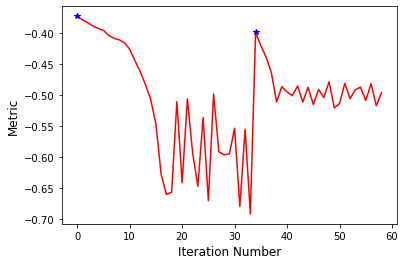

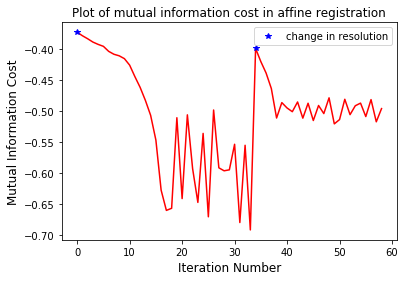

Affine metric value: -0.4918940997386689
Affine Optimizer's stopping condition, GradientDescentOptimizerv4Template: Convergence checker passed at iteration 25.


In [70]:
AFFINE_ITERATIONS = 100
BSPLINE_ITERATIONS = 200
#Affine Registration
initial_transform = sitk.CenteredTransformInitializer(fixed_img, moving_img, sitk.Euler2DTransform(), 
                                                      sitk.CenteredTransformInitializerFilter.GEOMETRY)
affine_method = sitk.ImageRegistrationMethod()

# Similarity metric settings.
affine_method.SetMetricAsMattesMutualInformation(numberOfHistogramBins=50)
affine_method.SetMetricSamplingStrategy(affine_method.RANDOM)
affine_method.SetMetricSamplingPercentage(0.15)

affine_method.SetInterpolator(INTERPOLATOR)

# Optimizer settings.
affine_method.SetOptimizerAsGradientDescent(learningRate=1, numberOfIterations= AFFINE_ITERATIONS, convergenceMinimumValue=1e-6, convergenceWindowSize=20)
affine_method.SetOptimizerScalesFromPhysicalShift()

# Setup for the multi-resolution framework.            
affine_method.SetShrinkFactorsPerLevel(shrinkFactors = [8,4])
affine_method.SetSmoothingSigmasPerLevel(smoothingSigmas=[4,2])
affine_method.SmoothingSigmasAreSpecifiedInPhysicalUnitsOn()

# Don't optimize in-place, we would possibly like to run this cell multiple times.
affine_method.SetInitialTransform(initial_transform, inPlace=False)

# Connect all of the observers so that we can perform plotting during registration.
affine_method.AddCommand(sitk.sitkStartEvent, start_plot)
affine_method.AddCommand(sitk.sitkMultiResolutionIterationEvent, update_multires_iterations) 
affine_method.AddCommand(sitk.sitkIterationEvent, lambda: update_plot(affine_method))

affine_transform = affine_method.Execute(sitk.Cast(fixed_img, sitk.sitkFloat32), 
                                               sitk.Cast(moving_img, sitk.sitkFloat32))

affine_fig = plot_metric('Plot of mutual information cost in affine registration')
plt.show()
verbose_save_fig(affine_fig, OUTPUT_PATH.joinpath(PREFIX + 'affine_metric_plot.jpeg'))
end_plot()

verbose_print('Affine metric value: {0}'.format(affine_method.GetMetricValue()))
verbose_print('Affine Optimizer\'s stopping condition, {0}'.format(affine_method.GetOptimizerStopConditionDescription()))

In [71]:
#Compute the mutual information between the two images after affine registration
moving_resampled_affine = sitk.Resample(moving_img, fixed_img, affine_transform, 
                                 INTERPOLATOR, 0.0, moving_img.GetPixelID())
affine_mutual_info = calculate_mutual_info(np.array(he_gray), np.array(get_pil_from_itk(moving_resampled_affine)))
verbose_print('Affine mutual information metric: {0}'.format(affine_mutual_info))

Affine mutual information metric: 0.18120201822372353


In [72]:
performance_df.loc[SLIDE_NUM, "Affine_Mutual_Info"] = affine_mutual_info
performance_df

,TP53_Slide_Name,H&E_Slide_Name,Template_Slide_Name,Initial_Mutual_Info,Affine_Mutual_Info
0,1820_N_10545A_4_TP53.svs,1820_N_10545A_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN,NaN
1,1820_T_105452F_4_TP53.svs,1820_T_105452F_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN,NaN
2,2065_N_12752A_4_TP53.svs,2065_N_12752A_2_HandE.svs,2171_T_11524A_2_HandE.svs,0.111367,0.181202
3,2065_T_12756A_4_TP53.svs,2065_T_12756A_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN,NaN
4,2112_N_12341B_4_TP53.svs,2112_N_12341B_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN,NaN
5,2112_T_12335F_4_TP53.svs,2112_T_12335F_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN,NaN
6,2148_N_11397A_4_TP53.svs,2148_N_11397A_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN,NaN
7,2148_T_11393A_4_TP53.svs,2148_T_11393A_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN,NaN
8,2171_N_11521A_4_TP53.svs,2171_N_11521A_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN,NaN
9,2171_T_11524A_4_TP53.svs,2171_T_11524A_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN,NaN


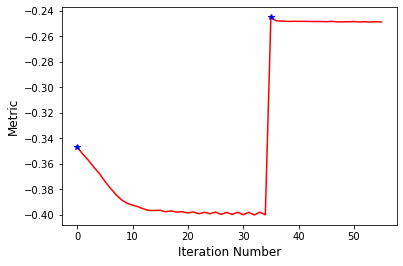

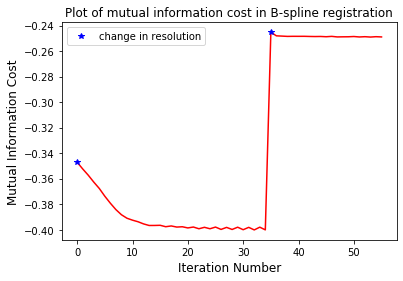

B-spline metric value: -0.24868569176733935
B-spline Optimizer's stopping condition, GradientDescentOptimizerv4Template: Convergence checker passed at iteration 21.


In [73]:
#B-spline registration
bspline_method = sitk.ImageRegistrationMethod()

# Similarity metric settings.
bspline_method.SetMetricAsMattesMutualInformation(numberOfHistogramBins=50)
bspline_method.SetMetricSamplingStrategy(bspline_method.RANDOM)
bspline_method.SetMetricSamplingPercentage(0.15)

bspline_method.SetInterpolator(INTERPOLATOR)

# Optimizer settings.
bspline_method.SetOptimizerAsGradientDescent(learningRate=1, numberOfIterations=BSPLINE_ITERATIONS, convergenceMinimumValue=1e-6, convergenceWindowSize=10)
bspline_method.SetOptimizerScalesFromPhysicalShift()

# Setup for the multi-resolution framework.            
bspline_method.SetShrinkFactorsPerLevel(shrinkFactors = [2,1])
bspline_method.SetSmoothingSigmasPerLevel(smoothingSigmas=[1,0])
bspline_method.SmoothingSigmasAreSpecifiedInPhysicalUnitsOn()

# Don't optimize in-place, we would possibly like to run this cell multiple times.
transformDomainMeshSize = [8]*moving_resampled_affine.GetDimension()
initial_transform = sitk.BSplineTransformInitializer(fixed_img, transformDomainMeshSize)
bspline_method.SetInitialTransform(initial_transform, inPlace=False)

# Connect all of the observers so that we can perform plotting during registration.
bspline_method.AddCommand(sitk.sitkStartEvent, start_plot)
bspline_method.AddCommand(sitk.sitkMultiResolutionIterationEvent, update_multires_iterations) 
bspline_method.AddCommand(sitk.sitkIterationEvent, lambda: update_plot(bspline_method))

bspline_transform = bspline_method.Execute(sitk.Cast(fixed_img, sitk.sitkFloat32), 
                                               sitk.Cast(moving_resampled_affine, sitk.sitkFloat32))

bspline_fig = plot_metric('Plot of mutual information cost in B-spline registration')
plt.show()
verbose_save_fig(bspline_fig, OUTPUT_PATH.joinpath(PREFIX + 'bspline_metric_plot.jpeg'))
end_plot()

verbose_print('B-spline metric value: {0}'.format(bspline_method.GetMetricValue()))
verbose_print('B-spline Optimizer\'s stopping condition, {0}'.format(bspline_method.GetOptimizerStopConditionDescription()))

In [75]:
#Compute the mutual information between the two images after B-spline registration
moving_resampled_final = sitk.Resample(moving_resampled_affine, fixed_img, bspline_transform, 
                                 INTERPOLATOR, 0.0, moving_img.GetPixelID())
bspline_mutual_info = calculate_mutual_info(np.array(he_gray), np.array(get_pil_from_itk(moving_resampled_final)))
verbose_print('B-spline mutual information metric: {0}'.format(bspline_mutual_info))

B-spline mutual information metric: 0.21365253754026864


In [76]:
performance_df.loc[SLIDE_NUM, "Final_Mutual_Info"] = bspline_mutual_info
performance_df

,TP53_Slide_Name,H&E_Slide_Name,Template_Slide_Name,Initial_Mutual_Info,Affine_Mutual_Info,Final_Mutual_Info
0,1820_N_10545A_4_TP53.svs,1820_N_10545A_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN,NaN,NaN
1,1820_T_105452F_4_TP53.svs,1820_T_105452F_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN,NaN,NaN
2,2065_N_12752A_4_TP53.svs,2065_N_12752A_2_HandE.svs,2171_T_11524A_2_HandE.svs,0.111367,0.181202,0.213653
3,2065_T_12756A_4_TP53.svs,2065_T_12756A_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN,NaN,NaN
4,2112_N_12341B_4_TP53.svs,2112_N_12341B_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN,NaN,NaN
5,2112_T_12335F_4_TP53.svs,2112_T_12335F_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN,NaN,NaN
6,2148_N_11397A_4_TP53.svs,2148_N_11397A_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN,NaN,NaN
7,2148_T_11393A_4_TP53.svs,2148_T_11393A_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN,NaN,NaN
8,2171_N_11521A_4_TP53.svs,2171_N_11521A_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN,NaN,NaN
9,2171_T_11524A_4_TP53.svs,2171_T_11524A_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN,NaN,NaN


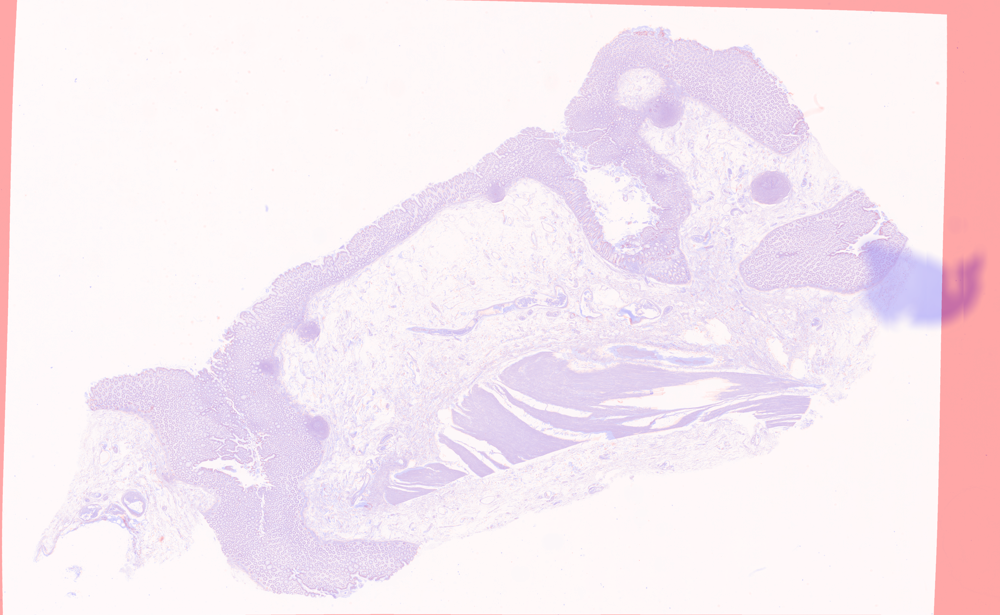

In [77]:
#Transform the original TP53 into the aligned TP53 image
moving_rgb_affine = sitk_transform_rgb(tp53, he_norm_small, affine_transform, INTERPOLATOR)
tp53_aligned = sitk_transform_rgb(moving_rgb_affine, he_norm_small, bspline_transform, INTERPOLATOR)
thumbnail(show_alignment(he_norm_small, tp53_aligned, prefilter = True))

In [78]:
#Remove backgrounds from TP53 and H&E images
tp53_filtered = filter_green(tp53_aligned)
he_filtered = filter_green(he_norm_small)
tp53_filtered = filter_grays(tp53_filtered, tolerance = 2)
he_filtered = filter_grays(he_filtered, tolerance = 15)

#Visually compare alignment between the registered TP53 and original H&E image
comparison_post = show_alignment(he_filtered, tp53_filtered)
verbose_save_img(comparison_post.convert('RGB'), OUTPUT_PATH.joinpath(PREFIX + 'comparison_post_registration.jpeg'), 'JPEG' )

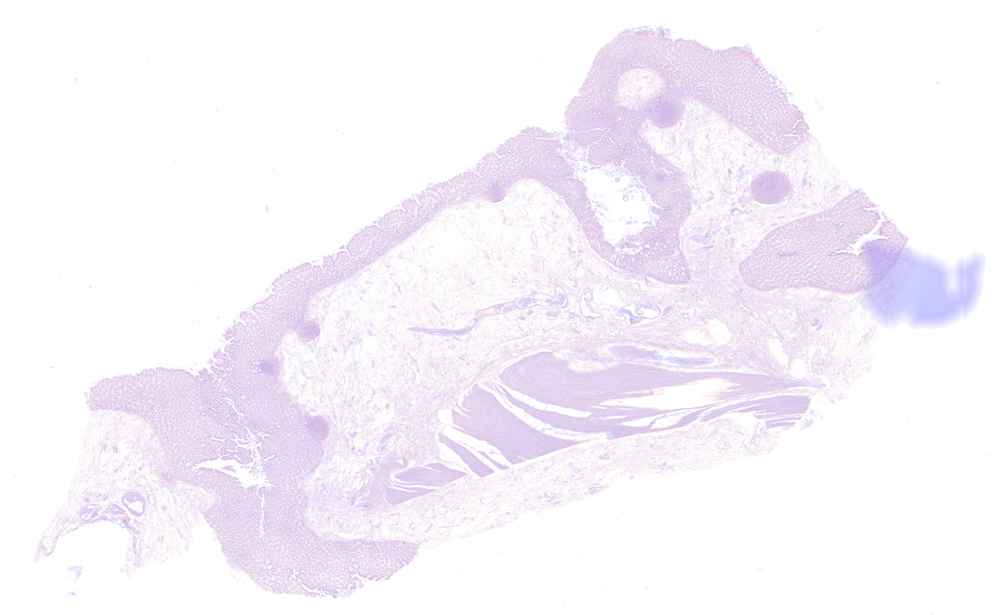

In [79]:
thumbnail(comparison_post)

In [80]:
####################################
# Generate cancer and tissue masks #
####################################

# def cancer_mask_v1(img, tile_size, cancer_thresh):
#     #Determine Dab threshold with a smaller 1000x1000 image
#     downsample = max(img.size)/1000
#     img_small_size = tuple([np.int(np.round(dim/downsample)) for dim in img.size])
#     img_small = img.resize(img_small_size, resample = Image.BICUBIC)
#     hed_small = rgb2hed(img_small)
#     dab_thresh = threshold_otsu_masked(hed_small)
#     mask = []
#     tgen = tile_gen(img, tile_size)
#     shape = next(tgen)
#     for tile in tgen:
#         tile = tile.convert('RGB')
#         tile_hed = rgb2hed(tile)
#         tile_dab = -tile_hed[:,:,2]
#         binary_dab = tile_dab > dab_thresh
#         if np.array(binary2gray(binary_dab)).mean() < cancer_thresh:
#             mask.append(0)
#         else:
#             mask.append(1)
#     return np.reshape(mask, shape) 

# def cancer_mask(img, tile_size, cancer_thresh = 250):
#     #Determine Dab threshold with a smaller 1000x1000 image
#     downsample = max(img.size)/1000
#     img_small_size = tuple([np.int(np.round(dim/downsample)) for dim in img.size])
#     img_small = img.resize(img_small_size, resample = Image.BICUBIC)
#     hed_small = rgb2hed(img_small)
#     dab_thresh = threshold_otsu_masked(hed_small)
#     #Extract Dab channel (stain)
#     hed = rgb2hed(img)
#     dab_channel = -hed[:,:,2]
#     dab_binary = dab_channel > dab_thresh
#     #Remove background staining 
#     dab_binary_filtered = remove_small_holes(dab_binary, area_threshold = 64)
#     tgen = tile_gen(binary2gray(dab_binary_filtered), tile_size)
#     c_mask = threshold_mask(tgen, cancer_thresh)
#     return c_mask 

def show_mask(mask):
    mask = mask.astype(np.uint8)
    plt.imshow(np.reshape(mask, mask.shape[::-1]))
    plt.colorbar()

In [81]:
tile_size = 299*ALIGNMENT_MAG/TILE_MAG

In [82]:
#Generate cancer mask and tissue mask from filtered tp53 image
c_mask = cancer_mask(tp53_filtered, tile_size, 250)
t_mask_tp53 = tissue_mask(tp53_filtered, tile_size, 0.01)
t_mask_he = tissue_mask(he_filtered, tile_size, 0.01)

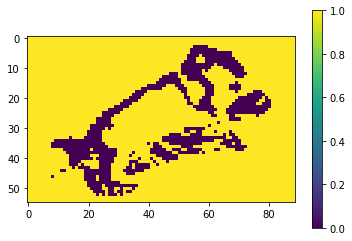

In [83]:
show_mask(t_mask_tp53)

In [84]:
def dab_tile_array(img, tile_size):
    dab_values = []
    tgen = tile_gen(img, tile_size)
    shape = next(tgen)
    for tile in tgen:
        tile = tile.convert('RGB')
        tile_hed = rgb2hed(tile)
        tile_dab = -tile_hed[:,:,2]
        dab_values.append(tile_dab.mean())
    return np.reshape(dab_values, shape)


def uncertain_mask(img, tile_size, cancer_thresh, non_cancer_thresh):
    dab_array = dab_tile_array(img, tile_size)
    binary_mask = ((cancer_thresh < dab_array) & (dab_array < non_cancer_thresh))
    return (np.invert(binary_mask)).astype(np.uint8)

In [85]:
#Generate tissue mask with tissue common to both the TP53 and H&E image
t_mask = np.logical_not(np.logical_not(t_mask_tp53) & np.logical_not(t_mask_he))


In [86]:
u_mask = uncertain_mask(tp53_filtered, tile_size, CANCER_THRESH, NON_CANCER_THRESH)
u_mask_filtered = np.logical_not(np.logical_not(u_mask) & np.logical_not(t_mask))

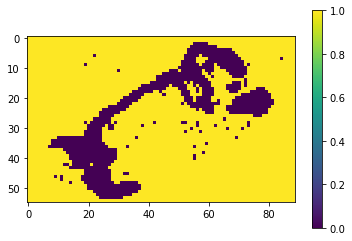

In [87]:
show_mask(c_mask)

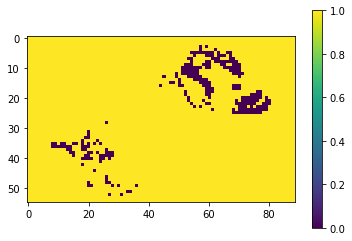

In [88]:
show_mask(u_mask_filtered)

In [89]:
#If Slide is normal
if '_N_' in PREFIX:
    #Merge cancer mask with uncertain mask
    u_mask_filtered = np.logical_not(np.logical_or(np.logical_not(u_mask_filtered), np.logical_not(c_mask.astype(np.bool))))
    #Blank out cancer mask
    c_mask = np.ones(c_mask.shape)
#If Slide is cancerous
if 'T' in PREFIX:
    #Merge non-cancer masks with uncertain mask
    non_cancer_mask = np.logical_not(np.logical_and(c_mask, np.logical_not(t_mask)))
    u_mask_filtered = np.logical_not(np.logical_or(np.logical_not(u_mask_filtered), np.logical_not(non_cancer_mask)))

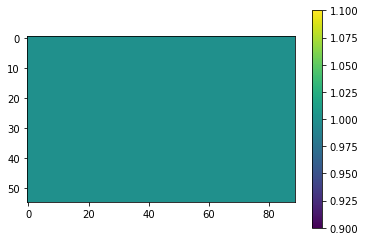

In [90]:
show_mask(c_mask)

In [91]:

#show_mask(non_cancer_mask)

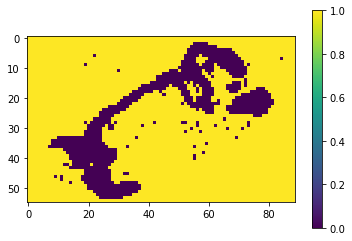

In [92]:
show_mask(u_mask_filtered)

In [93]:
#Filter tissue mask such that any uncertain tiles are removed
t_mask_filtered = np.zeros(t_mask.shape)
for x in range(t_mask.shape[0]):
    for y in range(t_mask.shape[1]):
        if t_mask[x, y] == 0 and u_mask[x, y] == 1:
            t_mask_filtered[x, y] = False
        else:
            t_mask_filtered[x, y] = True

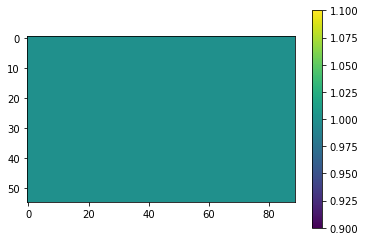

In [94]:
#Make sure all cancer tiles exist in the tissue mask
c_mask_filtered = np.logical_not(np.logical_not(c_mask) & np.logical_not(t_mask_filtered))

show_mask(c_mask_filtered)

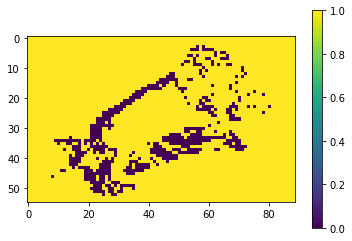

In [95]:
show_mask(t_mask_filtered)

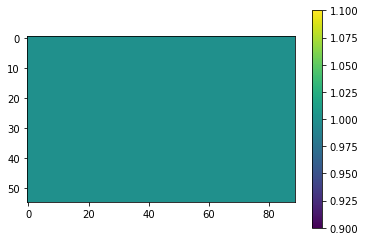

In [96]:
show_mask(c_mask)

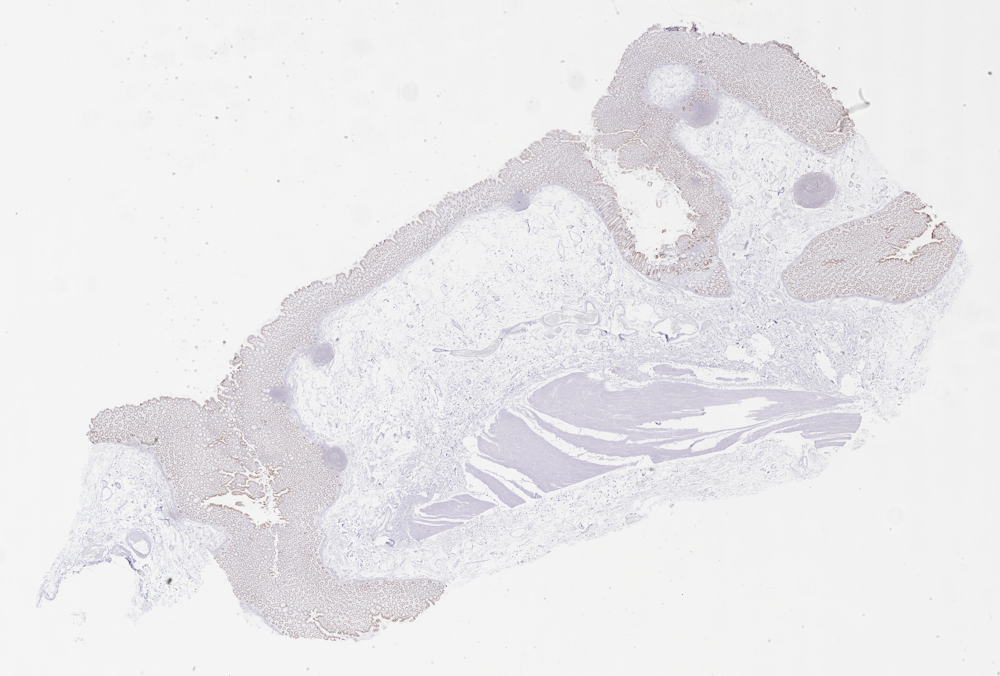

In [98]:
thumbnail(tp53)

In [99]:
overlay = plot_mask(tp53_filtered, u_mask_filtered.astype(np.uint8), tile_size)

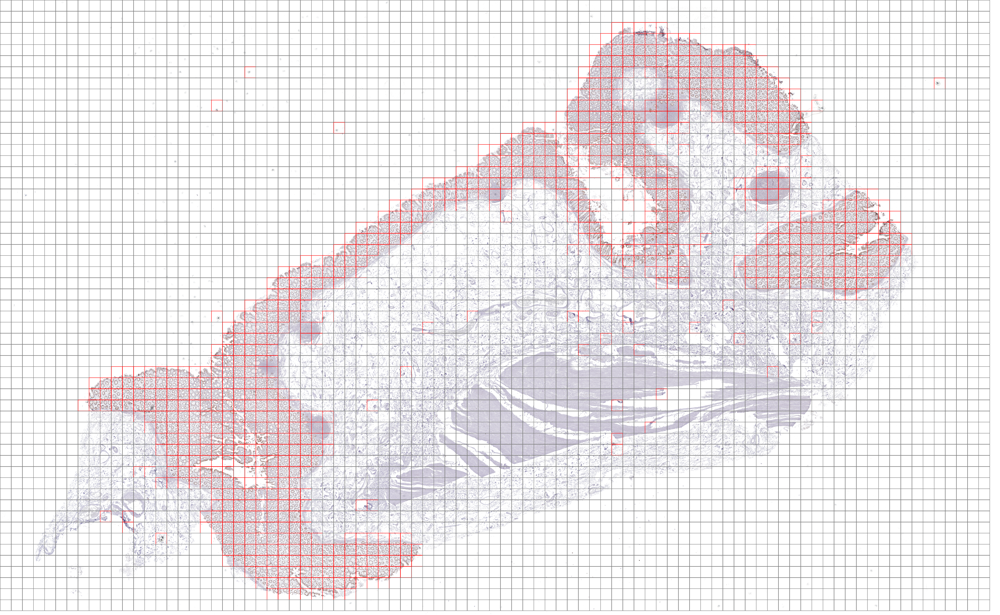

In [100]:
thumbnail(overlay)

In [101]:
def plot_masks(img, c_mask, t_mask,  tile_size, u_mask = None):
    img_overlay = img.copy()
    d = ImageDraw.Draw(img_overlay)
    tile_coords = tile_coordinates(img, tile_size)
    tile_coords['c_mask'] = c_mask.ravel()
    tile_coords['t_mask'] = t_mask.ravel()
    if u_mask is not None:
        tile_coords['u_mask'] = u_mask.ravel()
    width = int(np.round(tile_size*0.03))
    for row in tile_coords.itertuples(index = False):
        x_top_left, y_top_left = np.round(row[2:4])
        x_bottom_right, y_bottom_right = np.ceil(row[4:6])
        if row[6] == 0:
            outline = 'red'
        elif row[7] == 0:
            outline = 'lime'
        else:
            outline = 'grey'
        if u_mask is not None and row[8] == 0:
            outline = 'orange'
        d.rectangle([(x_top_left, y_top_left), (x_bottom_right, y_bottom_right)], outline = outline, width = width)
    return img_overlay

In [102]:
overlay_tp53 = plot_masks(tp53_filtered, c_mask_filtered, t_mask_filtered, tile_size, u_mask_filtered)
verbose_save_img(overlay_tp53.convert('RGB'), OUTPUT_PATH.joinpath(PREFIX + 'TP53_overlay.jpeg'), 'JPEG' )

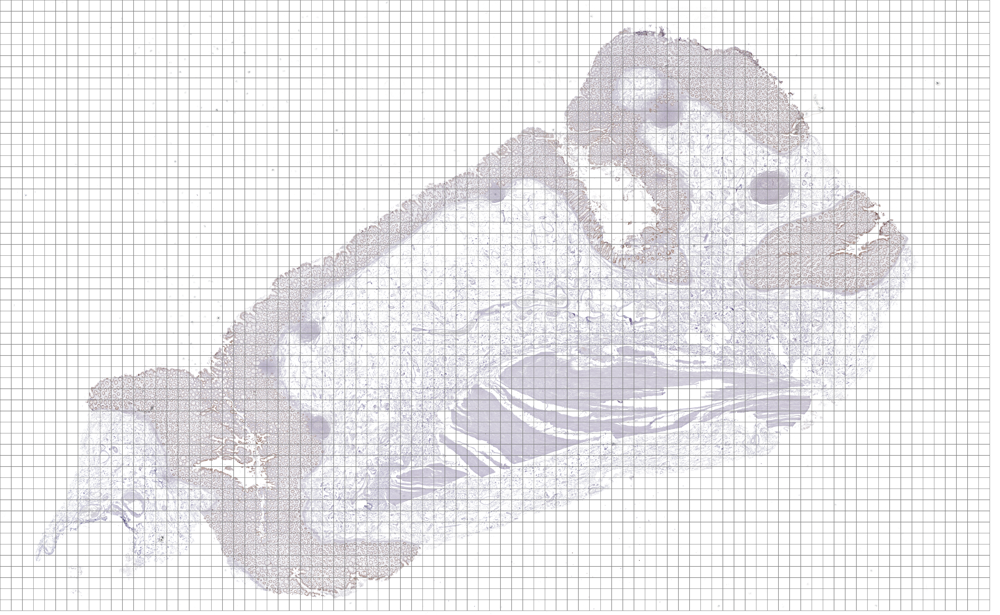

In [103]:
thumbnail(plot_mask(tp53_filtered, c_mask_filtered.astype(np.uint8), tile_size))

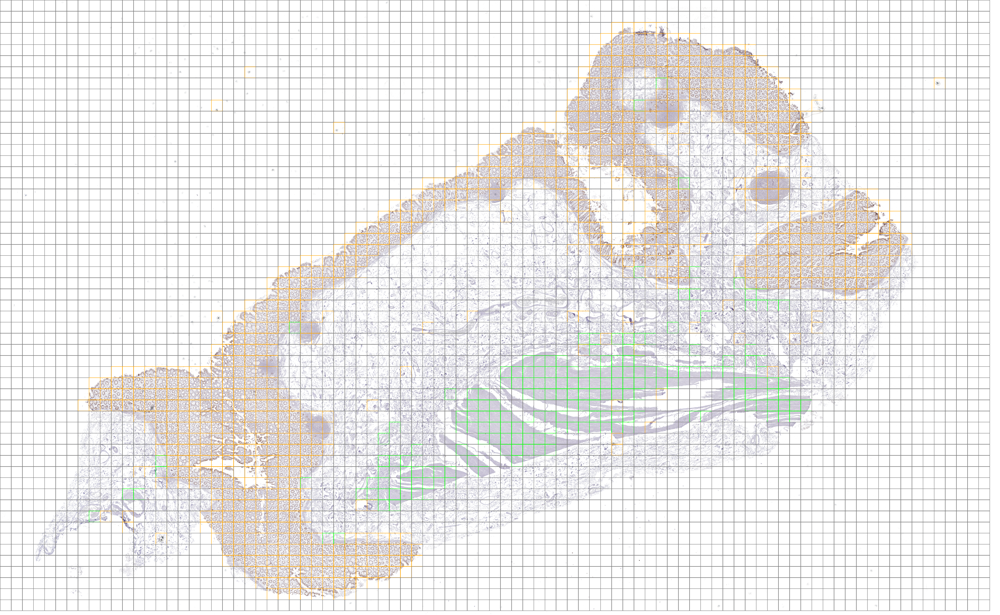

In [104]:
thumbnail(overlay_tp53)

In [105]:
overlay_he = plot_masks(he_filtered, c_mask_filtered, t_mask_filtered, tile_size, u_mask_filtered)
verbose_save_img(overlay_he.convert('RGB'), OUTPUT_PATH.joinpath(PREFIX + 'HE_overlay.jpeg'), 'JPEG' )

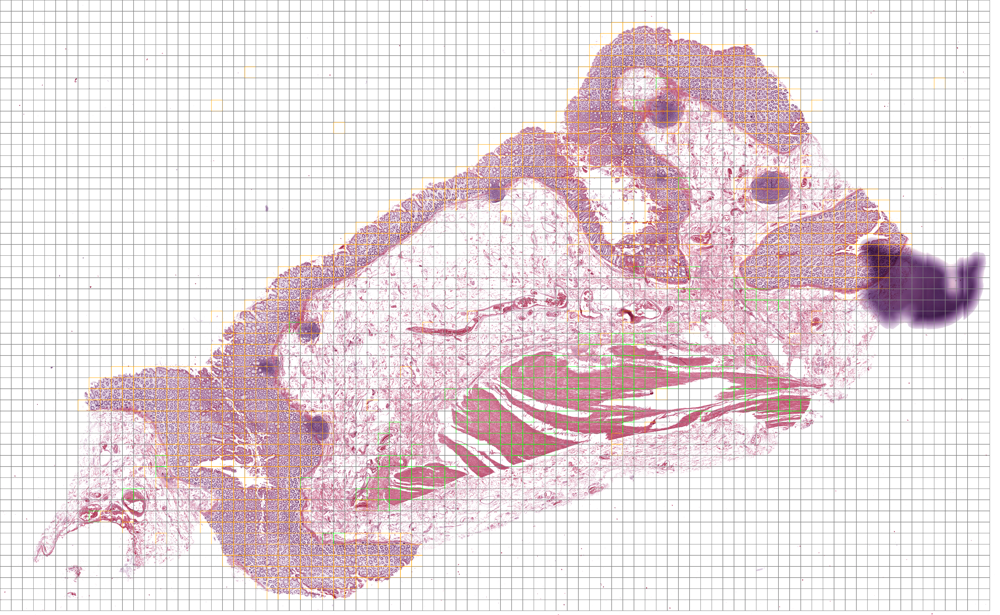

In [106]:
thumbnail(overlay_he)

In [66]:
##############
# Save Tiles #
##############

#Make Directory to save tiles
TILES_PATH = OUTPUT_PATH.joinpath('tiles_' + str(TILE_MAG) + 'x') 
os.makedirs(TILES_PATH, exist_ok = True)

In [123]:
def save_test_tiles(path, tile_gen, cancer_mask, tissue_mask, uncertain_mask, prefix = ''):
    os.makedirs(TILES_PATH.joinpath('cancer'), exist_ok = True)
    os.makedirs(TILES_PATH.joinpath('non-cancer'), exist_ok = True)
    os.makedirs(TILES_PATH.joinpath('uncertain'), exist_ok = True)
    x_tiles, y_tiles = next(tile_gen)
    verbose_print('Whole Image Size is {0} x {1}'.format(x_tiles, y_tiles))
    i = 0 
    for tile in tile_gen:
        img = tile.convert('RGB')
        ###
        img_np = np.array(img)
        if NORMALISER_METHOD == 'reinhard':
            img_norm = Image.fromarray(normaliser.transform_tile(img_np))
        else:
            img_std = lumStd.standardize_tile(img_np)
            img_norm = Image.fromarray(normaliser.transform_tile(img_std))
        ###
        #Name tile as horizontal position _ vertical position starting at (0,0)
        tile_name = prefix + str(np.floor_divide(i,x_tiles)) + '_' +  str(i%x_tiles) 
        if uncertain_mask.ravel()[i] == 0:
            img_norm.save(path.joinpath('uncertain', tile_name + '.jpeg'), 'JPEG')
        elif cancer_mask.ravel()[i] == 0:
            img_norm.save(path.joinpath('cancer', tile_name + '.jpeg'), 'JPEG')
        elif tissue_mask.ravel()[i] == 0:
            img_norm.save(path.joinpath('non-cancer', tile_name + '.jpeg'), 'JPEG')
        i += 1
    verbose_print('Exported tiles for {0}'.format(prefix))

In [68]:
tgen = tile_gen_at_mag(he_slide, TILE_MAG, 299)
save_test_tiles(TILES_PATH, tgen, c_mask_filtered, t_mask_filtered, u_mask_filtered, prefix = PREFIX)

Whole Image Size is 113 x 74
Exported tiles for 2112_N_12341B_4_


In [107]:
t_mask_filtered.astype(np.bool)

array([[ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       ...,
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True]])

In [114]:
non_cancer_tiles = np.invert(t_mask_filtered.astype(np.bool)).sum()

uncertain_tiles = np.invert(u_mask_filtered).sum()

cancer_tiles = np.invert(c_mask_filtered).sum()

In [115]:
uncertain_percentage = uncertain_tiles/non_cancer_tiles

In [116]:
cancer_percentage = cancer_tiles/non_cancer_tiles

In [121]:
performance_df.loc[SLIDE_NUM, "Cancer_Tiles"] = cancer_tiles
performance_df.loc[SLIDE_NUM, "Uncertain_Tiles"] = uncertain_tiles
performance_df.loc[SLIDE_NUM, "Non_Cancer_Tiles"] = non_cancer_tiles
performance_df

,TP53_Slide_Name,H&E_Slide_Name,Template_Slide_Name,Initial_Mutual_Info,Affine_Mutual_Info,Final_Mutual_Info,cancer_tiles,uncertain_tiles,non_cancer_tiles,Cancer_Tiles,Uncertain_Tiles,Non_Cancer_Tiles
0,1820_N_10545A_4_TP53.svs,1820_N_10545A_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1820_T_105452F_4_TP53.svs,1820_T_105452F_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2065_N_12752A_4_TP53.svs,2065_N_12752A_2_HandE.svs,2171_T_11524A_2_HandE.svs,0.111367,0.181202,0.213653,0.0,887.0,544.0,0.0,887.0,544.0
3,2065_T_12756A_4_TP53.svs,2065_T_12756A_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2112_N_12341B_4_TP53.svs,2112_N_12341B_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,2112_T_12335F_4_TP53.svs,2112_T_12335F_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,2148_N_11397A_4_TP53.svs,2148_N_11397A_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,2148_T_11393A_4_TP53.svs,2148_T_11393A_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,2171_N_11521A_4_TP53.svs,2171_N_11521A_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,2171_T_11524A_4_TP53.svs,2171_T_11524A_2_HandE.svs,2171_T_11524A_2_HandE.svs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [122]:
performance_df.to_csv(OUTPUT_PATH.joinpath('performance_metrics.csv'))